In [1]:
import pandas as pd
import numpy as np
import matplotlib as plt
import matplotlib.pyplot as plt
import sys
import csv
import requests
import re
from bs4 import BeautifulSoup
import nltk
from nltk import sent_tokenize
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer
import spacy  
from spacy import displacy  
import en_core_web_sm
import string
from wordcloud import WordCloud
from langdetect import detect
import seaborn as sns
import plotly.express as px
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

In [2]:
#dataset from https://data.mendeley.com/datasets/3t9vbwxgr5/2
songs = pd.read_csv('/Users/enavarre/Desktop/DS_course/DS_Final_Project/songs.csv')

In [3]:
songs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28372 entries, 0 to 28371
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artist_name       28372 non-null  object 
 1   track_name        28372 non-null  object 
 2   release_date      28372 non-null  int64  
 3   genre             28372 non-null  object 
 4   lyrics            28372 non-null  object 
 5   danceability      28372 non-null  float64
 6   loudness          28372 non-null  float64
 7   acousticness      28372 non-null  float64
 8   instrumentalness  28372 non-null  float64
 9   valence           28372 non-null  float64
 10  energy            28372 non-null  float64
 11  topic             28372 non-null  object 
 12  language          28372 non-null  object 
dtypes: float64(6), int64(1), object(6)
memory usage: 2.8+ MB


In [4]:
songs['topic'].value_counts()

sadness       6096
violence      5710
world/life    5420
obscene       4882
music         2303
night/time    1825
romantic      1524
feelings       612
Name: topic, dtype: int64

In [5]:
songs['lyrics']

0        hold time feel break feel untrue convince spea...
1        believe drop rain fall grow believe darkest ni...
2        sweetheart send letter goodbye secret feel bet...
3        kiss lips want stroll charm mambo chacha merin...
4        till darling till matter know till dream live ...
                               ...                        
28367    cause fuck leave scar tick tock clock come kno...
28368    minks things chain ring braclets yap fame come...
28369    get ban get ban stick crack relax plan attack ...
28370    check check yeah yeah hear thing call switch g...
28371    remix killer alive remix thriller trap bitch s...
Name: lyrics, Length: 28372, dtype: object

In [6]:
songs = songs[(songs.language == 'en')]

## Text preprocessing 

In [7]:
words = " ".join(songs['lyrics'])
words

'hold time feel break feel untrue convince speak voice tear try hold hurt try forgive okay play break string feel heart want feel tell real truth hurt lie worse anymore little turn dust play house ruin run leave save like chase train late late tear try hold hurt try forgive okay play break string feel heart want feel tell real truth hurt lie worse anymore little run leave save like chase train know late late play break string feel heart want feel tell real truth hurt lie worse anymore little know little hold time feel believe drop rain fall grow believe darkest night candle glow believe go astray come believe believe believe smallest prayer hear believe great hear word time hear bear baby touch leaf believe believe believe lord heaven guide sin hide believe calvary die pierce believe death rise meet heaven loud amen know believe sweetheart send letter goodbye secret feel better wake dream think real false emotions feel heartaches hang long blue get bluer song remember cloudy hair kiss 

In [8]:
tokens = word_tokenize(words)
tokens

['hold',
 'time',
 'feel',
 'break',
 'feel',
 'untrue',
 'convince',
 'speak',
 'voice',
 'tear',
 'try',
 'hold',
 'hurt',
 'try',
 'forgive',
 'okay',
 'play',
 'break',
 'string',
 'feel',
 'heart',
 'want',
 'feel',
 'tell',
 'real',
 'truth',
 'hurt',
 'lie',
 'worse',
 'anymore',
 'little',
 'turn',
 'dust',
 'play',
 'house',
 'ruin',
 'run',
 'leave',
 'save',
 'like',
 'chase',
 'train',
 'late',
 'late',
 'tear',
 'try',
 'hold',
 'hurt',
 'try',
 'forgive',
 'okay',
 'play',
 'break',
 'string',
 'feel',
 'heart',
 'want',
 'feel',
 'tell',
 'real',
 'truth',
 'hurt',
 'lie',
 'worse',
 'anymore',
 'little',
 'run',
 'leave',
 'save',
 'like',
 'chase',
 'train',
 'know',
 'late',
 'late',
 'play',
 'break',
 'string',
 'feel',
 'heart',
 'want',
 'feel',
 'tell',
 'real',
 'truth',
 'hurt',
 'lie',
 'worse',
 'anymore',
 'little',
 'know',
 'little',
 'hold',
 'time',
 'feel',
 'believe',
 'drop',
 'rain',
 'fall',
 'grow',
 'believe',
 'darkest',
 'night',
 'candle',
 'gl

In [9]:
stop_words = set(stopwords.words('english'))
stop_words

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'our',
 'ours',
 'ourselves',
 'out',
 'over',
 'own',
 'r

In [10]:
stripped = [word for word in tokens if word.isalpha()]
stripped[:10]

['hold',
 'time',
 'feel',
 'break',
 'feel',
 'untrue',
 'convince',
 'speak',
 'voice',
 'tear']

In [11]:
words_clean = [w for w in stripped if not w in stop_words]
words_clean

['hold',
 'time',
 'feel',
 'break',
 'feel',
 'untrue',
 'convince',
 'speak',
 'voice',
 'tear',
 'try',
 'hold',
 'hurt',
 'try',
 'forgive',
 'okay',
 'play',
 'break',
 'string',
 'feel',
 'heart',
 'want',
 'feel',
 'tell',
 'real',
 'truth',
 'hurt',
 'lie',
 'worse',
 'anymore',
 'little',
 'turn',
 'dust',
 'play',
 'house',
 'ruin',
 'run',
 'leave',
 'save',
 'like',
 'chase',
 'train',
 'late',
 'late',
 'tear',
 'try',
 'hold',
 'hurt',
 'try',
 'forgive',
 'okay',
 'play',
 'break',
 'string',
 'feel',
 'heart',
 'want',
 'feel',
 'tell',
 'real',
 'truth',
 'hurt',
 'lie',
 'worse',
 'anymore',
 'little',
 'run',
 'leave',
 'save',
 'like',
 'chase',
 'train',
 'know',
 'late',
 'late',
 'play',
 'break',
 'string',
 'feel',
 'heart',
 'want',
 'feel',
 'tell',
 'real',
 'truth',
 'hurt',
 'lie',
 'worse',
 'anymore',
 'little',
 'know',
 'little',
 'hold',
 'time',
 'feel',
 'believe',
 'drop',
 'rain',
 'fall',
 'grow',
 'believe',
 'darkest',
 'night',
 'candle',
 'gl

In [12]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");

In [ ]:
# Generate word cloud
#wordcloud = WordCloud(width= 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = stop_words).generate(words)# Plot
#plot_cloud(wordcloud)

In [13]:
#adding some words to our stopwords list
stop_words.update(['yeah', 'gonna', 'gotta', 'get'])

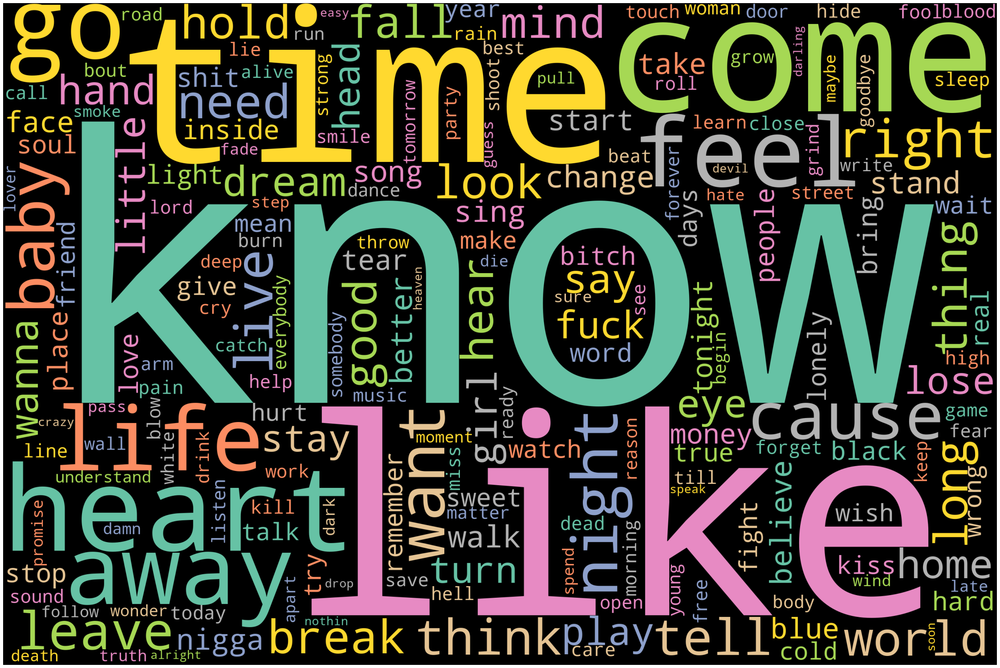

In [14]:
wordcloud = WordCloud(width= 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = stop_words).generate(words)# Plot
plot_cloud(wordcloud)

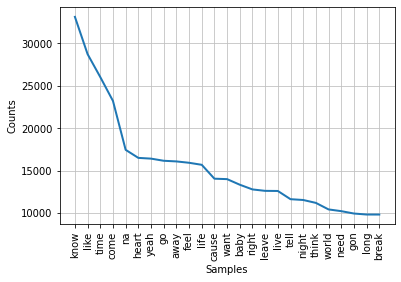

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [15]:
# Create freq dist and plot
freqdist = nltk.FreqDist(words_clean)
freqdist
freqdist.plot(25)

## Datasets per topic 

In [16]:
songs['topic'].value_counts()

sadness       5969
violence      5587
world/life    5309
obscene       4771
music         2216
night/time    1751
romantic      1467
feelings       544
Name: topic, dtype: int64

In [17]:
romantic = songs.loc[songs['topic'] == 'romantic']

In [18]:
romantic.head()

,artist_name,track_name,release_date,genre,lyrics,danceability,loudness,acousticness,instrumentalness,valence,energy,topic,language
3,pérez prado,patricia,1950,pop,kiss lips want stroll charm mambo chacha merin...,0.686992,0.744404,0.083935,0.199393,0.775350,0.743736,romantic,en
4,giorgos papadopoulos,apopse eida oneiro,1950,pop,till darling till matter know till dream live ...,0.291671,0.646489,0.975904,0.000246,0.597073,0.394375,romantic,en
8,stélios kazantzídis,klapse me mana klapse me,1950,pop,lonely night surround power read mind hour nig...,0.496372,0.666180,0.974900,0.000014,0.621805,0.400382,romantic,en
14,les paul,the carioca,1951,pop,see carioca foxtrot polka little rhythm blue r...,0.550525,0.682409,0.495983,0.504049,0.849547,0.642631,romantic,en
22,ghantasala,ee jagamantha natika,1952,pop,know baby hang touch weak strong know cope dow...,0.440052,0.606005,0.978916,0.000776,0.794930,0.399381,romantic,en


In [19]:
romantic.shape

(1467, 13)

In [20]:
words_romantic = " ".join(romantic['lyrics'])

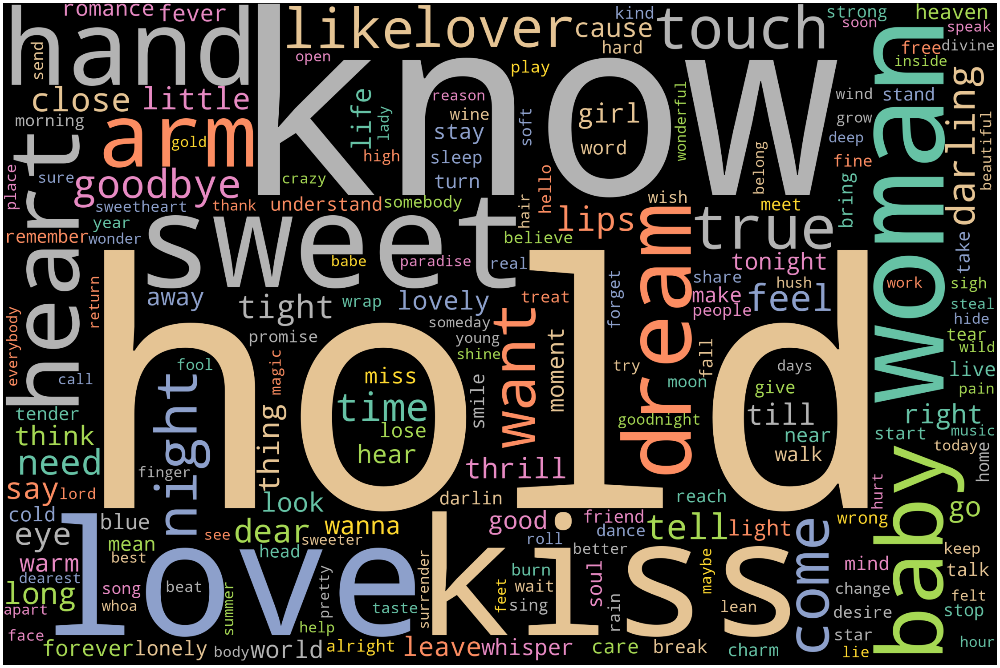

In [21]:
wordcloud_romantic = WordCloud(width= 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = stop_words).generate(words_romantic)# Plot
plot_cloud(wordcloud_romantic)

In [22]:
words_romantic = " ".join(romantic['lyrics'])
#words_romantic

In [23]:
tokens_romantic = word_tokenize(words_romantic)
#tokens_romantic

In [24]:
stripped_romantic = [word for word in tokens_romantic if word.isalpha()]
#stripped_romantic[:10]

In [25]:
words_romantic_clean = [w for w in stripped_romantic if not w in stop_words]
#words_romantic_clean

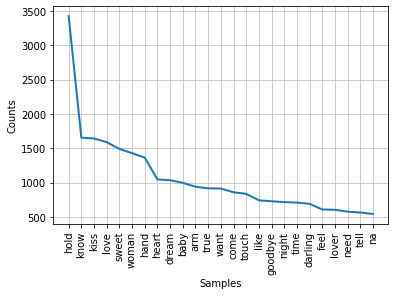

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [26]:
freqdist = nltk.FreqDist(words_romantic_clean)
freqdist
freqdist.plot(25)

## Topic modeling 1950-1975

In [27]:
romantic_50_75 = romantic[(romantic.release_date >= 1950) & (romantic.release_date <= 1975)]

In [29]:
romantic_50_75.tail()

,artist_name,track_name,release_date,genre,lyrics,danceability,loudness,acousticness,instrumentalness,valence,energy,topic,language
24004,the beatles,i want to hold your hand,1973,rock,yeah tell think understand want hold hand want...,0.470378,0.737174,0.527108,0.000002,0.940231,0.703694,romantic,en
24019,jim croce,dreamin' again,1973,rock,know dream night lyin soft warm talk share smi...,0.431387,0.629926,0.625502,0.000003,0.491962,0.336316,romantic,en
24047,ringo starr,only you (and you alone),1974,rock,oooooo oooooooo oooooooo oooo world right dark...,0.832124,0.503884,0.130521,0.000452,0.884584,0.303282,romantic,en
24071,queen,sweet lady,1975,rock,treat like tear inside lead bring shout believ...,0.272176,0.655591,0.004407,0.000600,0.683636,0.820815,romantic,en
24108,james taylor,how sweet it is (to be loved by you),1975,rock,sweet love sweet love need shelter arm need un...,0.760641,0.571648,0.253011,0.000000,0.789777,0.567554,romantic,en


In [30]:
all_words = romantic_50_75['lyrics'].str.split(expand=True).unstack().value_counts()

In [31]:
px.bar(all_words, x = all_words.index[:20],
      y = all_words.values[:20], 
      color = all_words.values[:20],
      title = 'Top 20 (Uncleaned) word frequencies in the dataset',
      labels=dict(x='Words', y='Frequency')) # Give some label on the different axes

In [32]:
vectorizer = CountVectorizer(min_df=0)
sentence_transform = vectorizer.fit_transform(words_romantic_clean)

In [33]:
vectorizer.get_feature_names()

/opt/anaconda3/envs/DataAnalytics/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



['aaaaaahhhh',
 'aaaaah',
 'aaaah',
 'aaah',
 'aaahhhh',
 'aaalmost',
 'aall',
 'aand',
 'abandon',
 'abdicate',
 'able',
 'ablow',
 'ablowin',
 'absolutely',
 'abuse',
 'acan',
 'accept',
 'accord',
 'account',
 'accrochestoi',
 'accurate',
 'acdc',
 'ace',
 'ache',
 'achieve',
 'achin',
 'acid',
 'acome',
 'acomin',
 'acoming',
 'acres',
 'act',
 'actin',
 'action',
 'adarlin',
 'add',
 'addict',
 'additional',
 'address',
 'adieu',
 'adingalinging',
 'adios',
 'adlib',
 'admire',
 'admit',
 'adobe',
 'adon',
 'adorable',
 'adore',
 'adoringly',
 'advance',
 'advantage',
 'adventure',
 'advice',
 'aeroplanes',
 'afadin',
 'afalling',
 'afar',
 'affair',
 'affairs',
 'affect',
 'affection',
 'affections',
 'afflictions',
 'afford',
 'afire',
 'afloat',
 'afraid',
 'african',
 'afternoon',
 'againthat',
 'age',
 'agettin',
 'aggravation',
 'agleam',
 'aglow',
 'agonies',
 'agony',
 'agree',
 'agressors',
 'agrowin',
 'ahah',
 'ahahahah',
 'ahahahahahah',
 'ahahh',
 'ahamlack',
 'ahard'

In [34]:
vectorizer = CountVectorizer(max_features = 2500,max_df = 0.05)

In [42]:
tf = vectorizer.fit_transform(romantic_50_75['lyrics'])
vectorizer.get_feature_names()

['aaah',
 'aaalmost',
 'aall',
 'ablow',
 'ablowin',
 'absolutely',
 'abuse',
 'accept',
 'accord',
 'accrochestoi',
 'ace',
 'ache',
 'achin',
 'act',
 'actin',
 'adarlin',
 'add',
 'additional',
 'adieu',
 'adingalinging',
 'adios',
 'adlib',
 'admire',
 'admit',
 'adobe',
 'adon',
 'adorable',
 'adore',
 'adoringly',
 'advantage',
 'adventure',
 'afadin',
 'afalling',
 'affair',
 'affairs',
 'affection',
 'afire',
 'afloat',
 'afraid',
 'afternoon',
 'againthat',
 'age',
 'agleam',
 'aglow',
 'agonies',
 'agree',
 'ahahh',
 'ahead',
 'ahha',
 'ahhh',
 'ahoney',
 'ahora',
 'ahuggin',
 'aisle',
 'ajust',
 'akissin',
 'akissing',
 'album',
 'alight',
 'alive',
 'allibied',
 'allontan',
 'allontanò',
 'allow',
 'almooost',
 'aloha',
 'alonei',
 'aloneno',
 'aloving',
 'alright',
 'altho',
 'amapola',
 'amaze',
 'amean',
 'amen',
 'amid',
 'amir',
 'amor',
 'amora',
 'amore',
 'ancor',
 'anderson',
 'anew',
 'angelis',
 'angels',
 'anger',
 'anniversary',
 'answer',
 'anybody',
 'anymore

In [43]:
tf.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [44]:
tf
# X containing the features!!!

<706x2500 sparse matrix of type '<class 'numpy.int64'>'
	with 8183 stored elements in Compressed Sparse Row format>

## Latent Dirichlet Allocation 

In [45]:
#Step 1. Instantiate the model
lda = LatentDirichletAllocation(n_components=5, max_iter=5,
                                learning_method = 'online', 
                                #mini-batch of training data to 
                                #update the ``components_``variable incrementally. 
                                learning_offset = 50.,
                                #parameter that downweights early 
                                #iterations in online learning
                                random_state = 42)

In [46]:
lda

LatentDirichletAllocation(learning_method='online', learning_offset=50.0,
                          max_iter=5, n_components=5, random_state=42)

In [47]:
#Step 2. Fit the model with the TF vectors calculated above
lda_model = lda.fit(tf)

In [48]:
lda_model

LatentDirichletAllocation(learning_method='online', learning_offset=50.0,
                          max_iter=5, n_components=5, random_state=42)

In [49]:
#Step 3. Visualize and analyse the results
lda_model.components_[1] # print the components of topic 1

array([0.31599366, 0.3362541 , 0.35956559, ..., 0.36222013, 0.33233527,
       0.35322492])

In [50]:
# Define helper function to print top words
def print_top_words(model, feature_names, n_top_words):
    for index, topic in enumerate(model.components_):
        message = "\nTopic #{}:".format(index)
        message += " ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1 :-1]])
        print(message)
        print("="*70)

In [51]:
print_top_words(lda_model, vectorizer.get_feature_names(), 10)


Topic #0:fever head alright people hello meter maid shirt morning dance

Topic #1:darlin sleep dearest yeahyeah goodnight lady talk eliminate gotta march

Topic #2:root fine desire tear truth years hush kind taste thank

Topic #3:send sweeter blueberry linger wind play matter maybe worry wine

Topic #4:remember soft young real reach fall wonderful treat somebody belong


In [52]:
n_top_words = 10
print("\nTopics in LDA model: ")
tf_feature_names = vectorizer.get_feature_names()

#tf_feature_names
print_top_words(lda_model, tf_feature_names, n_top_words)


Topics in LDA model: 

Topic #0:fever head alright people hello meter maid shirt morning dance

Topic #1:darlin sleep dearest yeahyeah goodnight lady talk eliminate gotta march

Topic #2:root fine desire tear truth years hush kind taste thank

Topic #3:send sweeter blueberry linger wind play matter maybe worry wine

Topic #4:remember soft young real reach fall wonderful treat somebody belong


In [53]:
lda_model.components_[0]

array([1.02270939, 0.34762503, 0.34591955, ..., 0.35980514, 0.99931179,
       0.36328583])

In [54]:
first_topic = lda_model.components_[0]
second_topic = lda_model.components_[1]
third_topic = lda_model.components_[2]
fourth_topic = lda_model.components_[3]

In [55]:
first_topic

array([1.02270939, 0.34762503, 0.34591955, ..., 0.35980514, 0.99931179,
       0.36328583])

Word Cloud visualizations of the topics

In [56]:
first_topic_words = [tf_feature_names[i] for i in first_topic.argsort()[:-50 - 1 :-1]]
#argsort() sorts in descending way->x[startAt:endBefore:skip]
second_topic_words = [tf_feature_names[i] for i in second_topic.argsort()[:-50 - 1 :-1]]
third_topic_words = [tf_feature_names[i] for i in third_topic.argsort()[:-50 - 1 :-1]]
fourth_topic_words = [tf_feature_names[i] for i in fourth_topic.argsort()[:-50 - 1 :-1]]

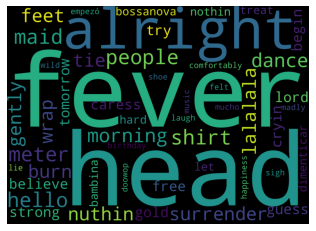

In [57]:
# Generating the wordcloud with the values under the category dataframe
firstcloud = WordCloud(stopwords=stop_words,
                        background_color='black',
                        width=2500,
                        height=1800
                         ).generate(" ".join(first_topic_words))
plt.imshow(firstcloud)
plt.axis('off')
plt.show()

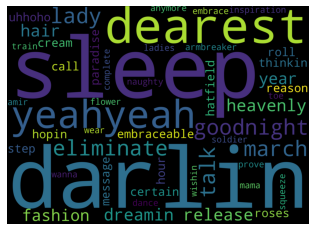

In [58]:
# Generating the wordcloud with the values under the category dataframe
cloud = WordCloud(stopwords=stop_words,
                          background_color='black',
                          width=2500,
                          height=1800
                         ).generate(" ".join(second_topic_words))
plt.imshow(cloud)
plt.axis('off')
plt.show()

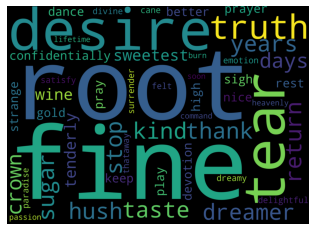

In [59]:
# Generating the wordcloud with the values under the category dataframe
cloud = WordCloud(stopwords=stop_words,
                          background_color='black',
                          width=2500,
                          height=1800
                         ).generate(" ".join(third_topic_words))
plt.imshow(cloud)
plt.axis('off')
plt.show()

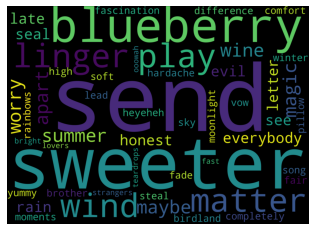

In [60]:
# Generating the wordcloud with the values under the category dataframe
cloud = WordCloud(
                          stopwords=stop_words,
                          background_color='black',
                          width=2500,
                          height=1800
                         ).generate(" ".join(fourth_topic_words))
plt.imshow(cloud)
plt.axis('off')
plt.show()

## Topic modeling 1975-2000 

In [61]:
romantic_75_00 = romantic[(romantic.release_date >= 1975) & (romantic.release_date <= 2000)]

In [63]:
romantic_75_00.tail()

,artist_name,track_name,release_date,genre,lyrics,danceability,loudness,acousticness,instrumentalness,valence,energy,topic,language
25872,orgy,stitches,1998,rock,stay leave turn grieve special dirty things ta...,0.433554,0.767223,0.000676,0.164980,0.609439,0.915913,romantic,en
25948,pearl jam,soldier of love,1999,rock,arm surrender arm peacefully arm squeeze love ...,0.528864,0.727072,0.143573,0.000008,0.749588,0.777771,romantic,en
25952,tom waits,hold on,1999,rock,hang sign live live leave like bullet leave ch...,0.424889,0.560470,0.886546,0.000197,0.649629,0.247224,romantic,en
25988,the smashing pumpkins,"try, try, try",2000,rock,tart mission know listen long hold hear detroi...,0.514784,0.752173,0.001374,0.887652,0.376546,0.854850,romantic,en
26007,deftones,knife prty,2000,rock,knife sharp chrome come inside bone fiends blo...,0.252681,0.814296,0.000250,0.023684,0.097279,0.883880,romantic,en


In [64]:
all_words = romantic_75_00['lyrics'].str.split(expand=True).unstack().value_counts()

In [65]:
px.bar(all_words, x = all_words.index[:20],
      y = all_words.values[:20], 
      color = all_words.values[:20],
      title = 'Top 20 (Uncleaned) word frequencies in the dataset',
      labels=dict(x='Words', y='Frequency')) # Give some label on the different axes

In [66]:
vectorizer = CountVectorizer(min_df=0)
sentence_transform = vectorizer.fit_transform(words_romantic_clean)

In [67]:
vectorizer.get_feature_names()

/opt/anaconda3/envs/DataAnalytics/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



['aaaaaahhhh',
 'aaaaah',
 'aaaah',
 'aaah',
 'aaahhhh',
 'aaalmost',
 'aall',
 'aand',
 'abandon',
 'abdicate',
 'able',
 'ablow',
 'ablowin',
 'absolutely',
 'abuse',
 'acan',
 'accept',
 'accord',
 'account',
 'accrochestoi',
 'accurate',
 'acdc',
 'ace',
 'ache',
 'achieve',
 'achin',
 'acid',
 'acome',
 'acomin',
 'acoming',
 'acres',
 'act',
 'actin',
 'action',
 'adarlin',
 'add',
 'addict',
 'additional',
 'address',
 'adieu',
 'adingalinging',
 'adios',
 'adlib',
 'admire',
 'admit',
 'adobe',
 'adon',
 'adorable',
 'adore',
 'adoringly',
 'advance',
 'advantage',
 'adventure',
 'advice',
 'aeroplanes',
 'afadin',
 'afalling',
 'afar',
 'affair',
 'affairs',
 'affect',
 'affection',
 'affections',
 'afflictions',
 'afford',
 'afire',
 'afloat',
 'afraid',
 'african',
 'afternoon',
 'againthat',
 'age',
 'agettin',
 'aggravation',
 'agleam',
 'aglow',
 'agonies',
 'agony',
 'agree',
 'agressors',
 'agrowin',
 'ahah',
 'ahahahah',
 'ahahahahahah',
 'ahahh',
 'ahamlack',
 'ahard'

In [68]:
vectorizer = CountVectorizer(max_features = 2500,max_df = 0.05)

In [69]:
tf = vectorizer.fit_transform(romantic_75_00['lyrics'])
vectorizer.get_feature_names()

['aaaaah',
 'aaaah',
 'aaah',
 'aaahhhh',
 'abdicate',
 'absolutely',
 'abuse',
 'acan',
 'account',
 'acdc',
 'ace',
 'ache',
 'achieve',
 'acome',
 'acres',
 'act',
 'action',
 'add',
 'addict',
 'address',
 'admit',
 'adore',
 'advance',
 'advantage',
 'advice',
 'aeroplanes',
 'affair',
 'affairs',
 'affect',
 'affection',
 'afford',
 'afire',
 'afraid',
 'african',
 'afternoon',
 'age',
 'agettin',
 'aggravation',
 'aglow',
 'agony',
 'agree',
 'agressors',
 'agrowin',
 'ahah',
 'ahahahah',
 'ahahahahahah',
 'ahahh',
 'ahamlack',
 'ahard',
 'ahead',
 'ahhh',
 'ahold',
 'aimez',
 'airplane',
 'airport',
 'aisle',
 'akiss',
 'akissing',
 'album',
 'alibi',
 'alive',
 'allinall',
 'allright',
 'almighty',
 'alot',
 'aloud',
 'alright',
 'alrightyeah',
 'amaze',
 'amend',
 'america',
 'american',
 'ananana',
 'anarchy',
 'ancient',
 'andevery',
 'andrews',
 'anemic',
 'anesthesia',
 'angelic',
 'angry',
 'anguish',
 'animal',
 'anniversary',
 'answer',
 'antic',
 'anybody',
 'anymore'

In [70]:
tf.toarray()

array([[0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [71]:
tf
# X containing the features!!!

<513x2500 sparse matrix of type '<class 'numpy.int64'>'
	with 7389 stored elements in Compressed Sparse Row format>

In [72]:
#Step 1. Instantiate the model
lda = LatentDirichletAllocation(n_components=5, max_iter=5,
                                learning_method = 'online', 
                                #mini-batch of training data to 
                                #update the ``components_``variable incrementally. 
                                learning_offset = 50.,
                                #parameter that downweights early 
                                #iterations in online learning
                                random_state = 42)

In [73]:
lda

LatentDirichletAllocation(learning_method='online', learning_offset=50.0,
                          max_iter=5, n_components=5, random_state=42)

In [74]:
#Step 2. Fit the model with the TF vectors calculated above
lda_model = lda.fit(tf)

In [75]:
lda_model

LatentDirichletAllocation(learning_method='online', learning_offset=50.0,
                          max_iter=5, n_components=5, random_state=42)

In [76]:
#Step 3. Visualize and analyse the results
lda_model.components_[1] # print the components of topic 1

array([0.34787205, 0.37358794, 0.40311948, ..., 0.40660499, 0.3778493 ,
       0.39539996])

In [77]:
# Define helper function to print top words
def print_top_words(model, feature_names, n_top_words):
    for index, topic in enumerate(model.components_):
        message = "\nTopic #{}:".format(index)
        message += " ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1 :-1]])
        print(message)
        print("="*70)

In [78]:
print_top_words(lda_model, vectorizer.get_feature_names(), 10)


Topic #0:fever people somebody whoah savoy tender daddy precious everybody woooy

Topic #1:knife anemic float room bone floor chrome queen block fiends

Topic #2:gotta wrap lady lovers clap summer alright lifetime darlin wind

Topic #3:stop leggo roll paradise desire melt jive solution swear limit

Topic #4:lovely hurt fantasy body nights reason send deep tooth african


In [79]:
n_top_words = 10
print("\nTopics in LDA model: ")
tf_feature_names = vectorizer.get_feature_names()

#tf_feature_names
print_top_words(lda_model, tf_feature_names, n_top_words)


Topics in LDA model: 

Topic #0:fever people somebody whoah savoy tender daddy precious everybody woooy

Topic #1:knife anemic float room bone floor chrome queen block fiends

Topic #2:gotta wrap lady lovers clap summer alright lifetime darlin wind

Topic #3:stop leggo roll paradise desire melt jive solution swear limit

Topic #4:lovely hurt fantasy body nights reason send deep tooth african


In [80]:
lda_model.components_[0]

array([0.40353031, 0.38809565, 0.38585703, ..., 0.40354789, 1.03069968,
       2.83966339])

In [81]:
first_topic = lda_model.components_[0]
second_topic = lda_model.components_[1]
third_topic = lda_model.components_[2]
fourth_topic = lda_model.components_[3]

In [82]:
first_topic

array([0.40353031, 0.38809565, 0.38585703, ..., 0.40354789, 1.03069968,
       2.83966339])

In [83]:
first_topic_words = [tf_feature_names[i] for i in first_topic.argsort()[:-50 - 1 :-1]]
#argsort() sorts in descending way->x[startAt:endBefore:skip]
second_topic_words = [tf_feature_names[i] for i in second_topic.argsort()[:-50 - 1 :-1]]
third_topic_words = [tf_feature_names[i] for i in third_topic.argsort()[:-50 - 1 :-1]]
fourth_topic_words = [tf_feature_names[i] for i in fourth_topic.argsort()[:-50 - 1 :-1]]

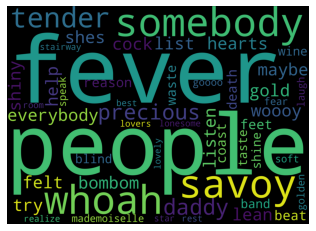

In [84]:
# Generating the wordcloud with the values under the category dataframe
firstcloud = WordCloud(stopwords=stop_words,
                        background_color='black',
                        width=2500,
                        height=1800
                         ).generate(" ".join(first_topic_words))
plt.imshow(firstcloud)
plt.axis('off')
plt.show()

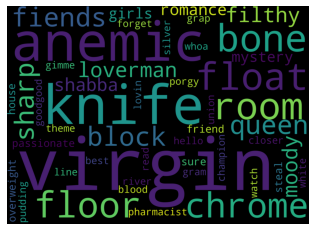

In [85]:
# Generating the wordcloud with the values under the category dataframe
cloud = WordCloud(stopwords=stop_words,
                          background_color='black',
                          width=2500,
                          height=1800
                         ).generate(" ".join(second_topic_words))
plt.imshow(cloud)
plt.axis('off')
plt.show()

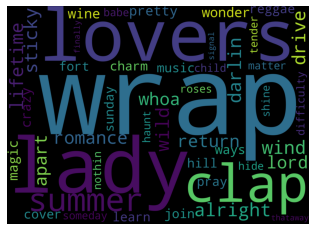

In [86]:
# Generating the wordcloud with the values under the category dataframe
cloud = WordCloud(stopwords=stop_words,
                          background_color='black',
                          width=2500,
                          height=1800
                         ).generate(" ".join(third_topic_words))
plt.imshow(cloud)
plt.axis('off')
plt.show()

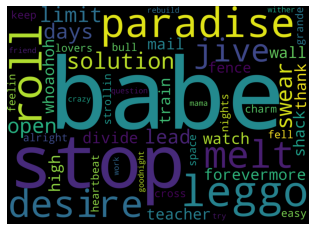

In [87]:
# Generating the wordcloud with the values under the category dataframe
cloud = WordCloud(
                          stopwords=stop_words,
                          background_color='black',
                          width=2500,
                          height=1800
                         ).generate(" ".join(fourth_topic_words))
plt.imshow(cloud)
plt.axis('off')
plt.show()

## Topic modeling 2000 - 2019

In [88]:
romantic_00_19 = romantic[(romantic.release_date >= 2000) & (romantic.release_date <= 2019)]

In [90]:
romantic_00_19.tail()

,artist_name,track_name,release_date,genre,lyrics,danceability,loudness,acousticness,instrumentalness,valence,energy,topic,language
27211,sufjan stevens,visions of gideon,2017,rock,love time video video touch time video video l...,0.206109,0.447658,0.945783,0.684211,0.181781,0.314293,romantic,en
27454,x ambassadors,hold you down,2019,rock,ones dance light hold hold ones dance faceless...,0.558107,0.771838,0.049296,0.000001,0.435284,0.627616,romantic,en
27800,night shield,"monsters (cruelty 5) (feat. frank waln, young ...",2012,hip hop,nights long go away think true miss voice touc...,0.671829,0.782401,0.115461,0.000000,0.770198,0.776770,romantic,en
27982,t-rock,4:20/reincarnated,2016,hip hop,feel feel felt spell feel like time fake finge...,0.795299,0.621593,0.000072,0.000000,0.207543,0.454437,romantic,en
28347,aaliyah,more than a woman,2019,hip hop,passion instant sweat bead feel cupid shoot he...,0.638254,0.762505,0.055019,0.001255,0.781533,0.644634,romantic,en


In [91]:
all_words = romantic_00_19['lyrics'].str.split(expand=True).unstack().value_counts()

In [92]:
px.bar(all_words, x = all_words.index[:20],
      y = all_words.values[:20], 
      color = all_words.values[:20],
      title = 'Top 20 (Uncleaned) word frequencies in the dataset',
      labels=dict(x='Words', y='Frequency')) # Give some label on the different axes

In [93]:
vectorizer = CountVectorizer(min_df=0)
sentence_transform = vectorizer.fit_transform(words_romantic_clean)

In [94]:
vectorizer.get_feature_names()

/opt/anaconda3/envs/DataAnalytics/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



['aaaaaahhhh',
 'aaaaah',
 'aaaah',
 'aaah',
 'aaahhhh',
 'aaalmost',
 'aall',
 'aand',
 'abandon',
 'abdicate',
 'able',
 'ablow',
 'ablowin',
 'absolutely',
 'abuse',
 'acan',
 'accept',
 'accord',
 'account',
 'accrochestoi',
 'accurate',
 'acdc',
 'ace',
 'ache',
 'achieve',
 'achin',
 'acid',
 'acome',
 'acomin',
 'acoming',
 'acres',
 'act',
 'actin',
 'action',
 'adarlin',
 'add',
 'addict',
 'additional',
 'address',
 'adieu',
 'adingalinging',
 'adios',
 'adlib',
 'admire',
 'admit',
 'adobe',
 'adon',
 'adorable',
 'adore',
 'adoringly',
 'advance',
 'advantage',
 'adventure',
 'advice',
 'aeroplanes',
 'afadin',
 'afalling',
 'afar',
 'affair',
 'affairs',
 'affect',
 'affection',
 'affections',
 'afflictions',
 'afford',
 'afire',
 'afloat',
 'afraid',
 'african',
 'afternoon',
 'againthat',
 'age',
 'agettin',
 'aggravation',
 'agleam',
 'aglow',
 'agonies',
 'agony',
 'agree',
 'agressors',
 'agrowin',
 'ahah',
 'ahahahah',
 'ahahahahahah',
 'ahahh',
 'ahamlack',
 'ahard'

In [95]:
vectorizer = CountVectorizer(max_features = 2500,max_df = 0.05)

In [96]:
tf = vectorizer.fit_transform(romantic_00_19['lyrics'])
vectorizer.get_feature_names()

['aaaaaahhhh',
 'aaaah',
 'aaah',
 'aand',
 'abandon',
 'able',
 'absolutely',
 'accurate',
 'ache',
 'acid',
 'acomin',
 'acoming',
 'act',
 'addict',
 'adieu',
 'admit',
 'adventure',
 'advice',
 'afar',
 'affair',
 'affection',
 'affections',
 'afflictions',
 'afford',
 'afloat',
 'afraid',
 'age',
 'agree',
 'ainado',
 'airplane',
 'aisle',
 'akogare',
 'akon',
 'alabama',
 'alarm',
 'album',
 'alcohol',
 'alimony',
 'alive',
 'allow',
 'aloud',
 'alright',
 'amaze',
 'amen',
 'amist',
 'amore',
 'ancient',
 'andrews',
 'anemic',
 'angels',
 'angry',
 'animal',
 'answer',
 'anticipation',
 'anybody',
 'anymore',
 'anytime',
 'aone',
 'apart',
 'apartment',
 'appal',
 'appear',
 'applause',
 'applauseplause',
 'apple',
 'appreciate',
 'approach',
 'aqui',
 'architects',
 'arctic',
 'aren',
 'argue',
 'arizona',
 'arme',
 'arrive',
 'arriverait',
 'artist',
 'artpop',
 'ash',
 'ashamed',
 'ask',
 'asleep',
 'asphalt',
 'aston',
 'astound',
 'astray',
 'astrologists',
 'asufferation',

In [97]:
tf.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [98]:
tf
# X containing the features!!!

<275x2158 sparse matrix of type '<class 'numpy.int64'>'
	with 4385 stored elements in Compressed Sparse Row format>

In [99]:
#Step 1. Instantiate the model
lda = LatentDirichletAllocation(n_components=5, max_iter=5,
                                learning_method = 'online', 
                                #mini-batch of training data to 
                                #update the ``components_``variable incrementally. 
                                learning_offset = 50.,
                                #parameter that downweights early 
                                #iterations in online learning
                                random_state = 42)

In [100]:
lda

LatentDirichletAllocation(learning_method='online', learning_offset=50.0,
                          max_iter=5, n_components=5, random_state=42)

In [101]:
#Step 2. Fit the model with the TF vectors calculated above
lda_model = lda.fit(tf)

In [102]:
lda_model

LatentDirichletAllocation(learning_method='online', learning_offset=50.0,
                          max_iter=5, n_components=5, random_state=42)

In [103]:
#Step 3. Visualize and analyse the results
lda_model.components_[1] # print the components of topic 1

array([2.26918928, 0.46780822, 0.57476014, ..., 0.5209686 , 0.53630251,
       0.51102636])

In [104]:
# Define helper function to print top words
def print_top_words(model, feature_names, n_top_words):
    for index, topic in enumerate(model.components_):
        message = "\nTopic #{}:".format(index)
        message += " ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1 :-1]])
        print(message)
        print("="*70)

In [105]:
print_top_words(lda_model, vectorizer.get_feature_names(), 10)


Topic #0:dance oohooh ones follow enemy moment sake hello river matter

Topic #1:near lean whoa special share drone emotion deserve express lord

Topic #2:natural cover replace worst amen decide worthless lovers jealous applause

Topic #3:shiver thump shall intimate owley wine gyal woah wiener check

Topic #4:absolutely visions video loove praise lovely feet week knock body


In [106]:
n_top_words = 10
print("\nTopics in LDA model: ")
tf_feature_names = vectorizer.get_feature_names()

#tf_feature_names
print_top_words(lda_model, tf_feature_names, n_top_words)


Topics in LDA model: 

Topic #0:dance oohooh ones follow enemy moment sake hello river matter

Topic #1:near lean whoa special share drone emotion deserve express lord

Topic #2:natural cover replace worst amen decide worthless lovers jealous applause

Topic #3:shiver thump shall intimate owley wine gyal woah wiener check

Topic #4:absolutely visions video loove praise lovely feet week knock body


In [107]:
lda_model.components_[0]

array([0.54311504, 2.64637653, 0.91916895, ..., 0.9532363 , 0.94869299,
       0.92175964])

In [108]:
first_topic = lda_model.components_[0]
second_topic = lda_model.components_[1]
third_topic = lda_model.components_[2]
fourth_topic = lda_model.components_[3]

In [109]:
first_topic

array([0.54311504, 2.64637653, 0.91916895, ..., 0.9532363 , 0.94869299,
       0.92175964])

In [110]:
first_topic_words = [tf_feature_names[i] for i in first_topic.argsort()[:-50 - 1 :-1]]
#argsort() sorts in descending way->x[startAt:endBefore:skip]
second_topic_words = [tf_feature_names[i] for i in second_topic.argsort()[:-50 - 1 :-1]]
third_topic_words = [tf_feature_names[i] for i in third_topic.argsort()[:-50 - 1 :-1]]
fourth_topic_words = [tf_feature_names[i] for i in fourth_topic.argsort()[:-50 - 1 :-1]]

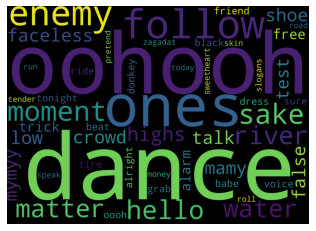

In [111]:
# Generating the wordcloud with the values under the category dataframe
firstcloud = WordCloud(stopwords=stop_words,
                        background_color='black',
                        width=2500,
                        height=1800
                         ).generate(" ".join(first_topic_words))
plt.imshow(firstcloud)
plt.axis('off')
plt.show()

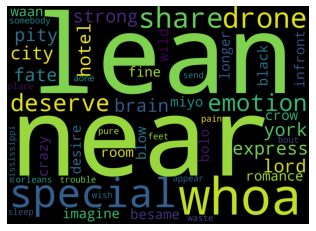

In [112]:
# Generating the wordcloud with the values under the category dataframe
cloud = WordCloud(stopwords=stop_words,
                          background_color='black',
                          width=2500,
                          height=1800
                         ).generate(" ".join(second_topic_words))
plt.imshow(cloud)
plt.axis('off')
plt.show()

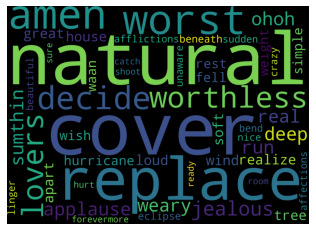

In [113]:
# Generating the wordcloud with the values under the category dataframe
cloud = WordCloud(stopwords=stop_words,
                          background_color='black',
                          width=2500,
                          height=1800
                         ).generate(" ".join(third_topic_words))
plt.imshow(cloud)
plt.axis('off')
plt.show()

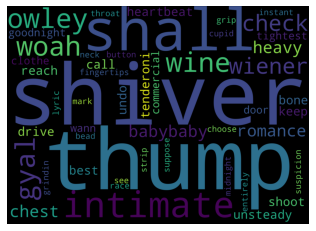

In [114]:
# Generating the wordcloud with the values under the category dataframe
cloud = WordCloud(
                          stopwords=stop_words,
                          background_color='black',
                          width=2500,
                          height=1800
                         ).generate(" ".join(fourth_topic_words))
plt.imshow(cloud)
plt.axis('off')
plt.show()